- Reveal Themes: https://github.com/hakimel/reveal.js/tree/master/css/theme/source
- How to save pdf: https://revealjs.com/pdf-export/
- `jupyter nbconvert --to slides augmentation-demo.ipynb --post serve --SlidesExporter.reveal_theme=simple`

# Image Augmentation:
### A Practical Guide to Prevent Overfitting in Computer Vision

### Jes Ford here 👋

I'm a senior data scientist at Recursion.

We take images of human cells to find cures for diseases.

I develop and train machine learning models to improve the image embeddings that we use to discover medicines.

I also _really_ like snowboarding (thats why I moved to Utah), have a PhD in physics, and run the local PyLadies Meetup.

... p.s. we're hiring, a lot! check out [recursionpharma.com/jobs](https://recursionpharma.com/jobs)

In [ ]:
def my_talk():
    why = background()
    what = basic_overview()
    how = practical_demo(**cute_dogs)
    🤯 = advanced_augmentations()
    results = recursion_kaggle_competition()

# Goal: we want models that generalize

i.e. avoid overfitting, perform well on completely new data

Generic overfitting illustration:

<img src="https://miro.medium.com/max/1000/1*nhmPdWSGh3ziatQKOmVq0Q.png">

[Image Source](https://medium.com/analytics-vidhya/early-stopping-with-pytorch-to-restrain-your-model-from-overfitting-dce6de4081c5)

# Goal: we want models that generalize

i.e. avoid overfitting, perform well on completely new data

Many ways to prevent overfitting (including dropout, large learning rates, small batch sizes, weight decay...)

In this talk we focus on the <ins>**root cause**</ins> of the problem: access to <ins>**limited data**</ins>

- dropout randomly zeros out some of the activations forcing the network to learn robust features instead of focusing on specific neurons
- large LRs can excape local minima
- small batch sizes are noisy
- weight decay penalizes large weights (kinda analogous to L2 regularization but more complicated)

# Limited Data Problem #1: more is better but costs 💰

Models get better the more (good) training data you have

Labeled training data is expensive
- humans hand-labeling cats, hotdogs, airplanes...
- ImageNet has >14M images, labelled via [mechanical turk](https://qz.com/1034972/the-data-that-changed-the-direction-of-ai-research-and-possibly-the-world/)...
- Medical images are costly, certain conditions are rare

# Limited Data Problem #2: invariants

Robust models should be invariant to certain changes in an image (e.g. *translational invariance*)

<img src="https://i.stack.imgur.com/UKwFg.jpg">

[Image Source](https://towardsdatascience.com/image-augmentation-for-deep-learning-histogram-equalization-a71387f609b2)

# Solution: Image augmentations

Increase the size of your training dataset using the images you already have.

Two distinct classes of augmentations:
1. **basic image transformations** (focus of this talk)
2. deep learning approaches (adversarial training, GAN augmentation, style transfer)

# Image Transformations

- geometric
- colorspace
- kernel filters
- random erasing
- mixing images

<img src="https://albumentations.ai/assets/img/custom/albumentations_logo.png" style="width: 100px;">

"Albumentations is a Python library for fast and flexible image augmentations. Albumentations efficiently implements a rich variety of image transform operations that are optimized for performance, and does so while providing a concise, yet powerful image augmentation interface for different computer vision tasks, including object classification, segmentation, and detection."  [https://albumentations.ai/](https://albumentations.ai/)

`pip install albumentations`

In [1]:
import albumentations as A

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def show_img(img, figsize=(8, 8)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img)
    ax.set_yticklabels([])
    ax.set_xticklabels([])

# Image Transformations

- geometric $\leftarrow$
- colorspace
- kernel filters
- random erasing
- mixing images

# Geometric transformations

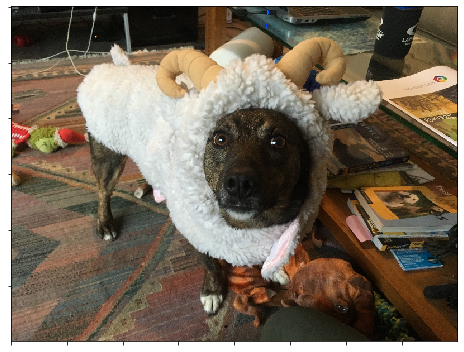

In [37]:
image = cv2.imread('images/toki_as_sheep.jpg')  # cute dog #1
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (800, 600))
show_img(image)

# Geometric transformations

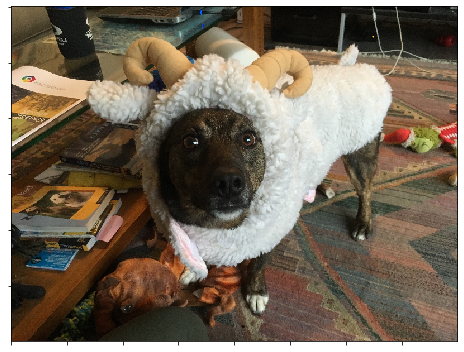

In [5]:
transform = A.HorizontalFlip(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

In [6]:
transform = A.HorizontalFlip(p=1)   # class that implements the apply method
new_image = transform(image=image)  # transform returns a dictionary
new_image.keys()

dict_keys(['image'])

# Geometric transformations

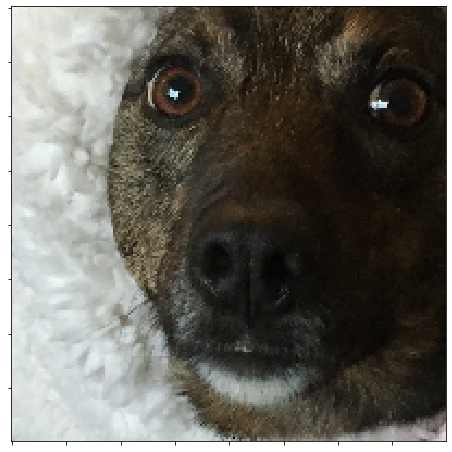

In [7]:
transform = A.CenterCrop(200, 200, p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Geometric transformations

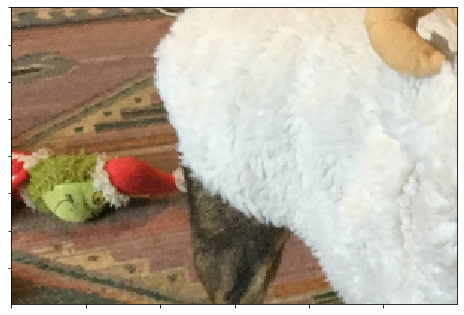

In [51]:
transform = A.RandomCrop(200, 300, p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Geometric transformations

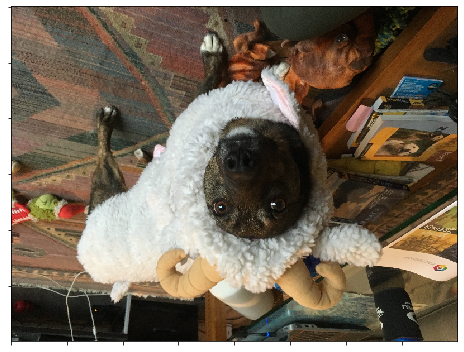

In [9]:
transform = A.VerticalFlip(p=1)  # does this make sense for use case?

new_image = transform(image=image)['image']
show_img(new_image)

# Geometric transformations

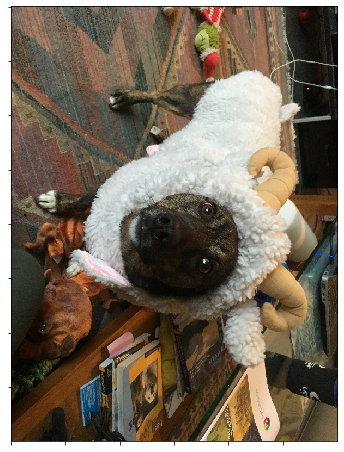

In [56]:
transform = A.RandomRotate90(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Geometric transformations

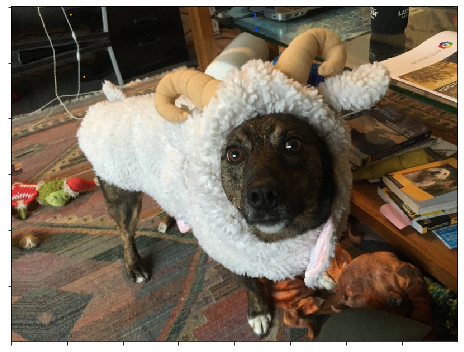

In [58]:
transform = A.ShiftScaleRotate(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Geometric Transformations Summary

- flips: horizontal most common
- crops: random or center are common, can be practical approach to heterogenous input
- rotations: small angles common
- shifts/translations

$\rightarrow$ _What transforms make sense for my data? Do they preserve the label?_

<img src="https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png" style="width: 500px;">

# Image Transformations

- geometric
- colorspace $\leftarrow$
- kernel filters
- random erasing
- mixing images

# Colorspace Transformations

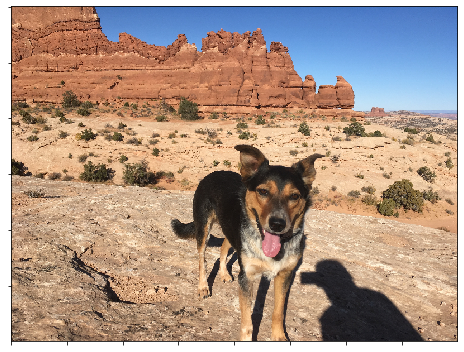

In [59]:
image = cv2.imread('images/kazu_in_moab.jpg')  # cute dog #2
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (800, 600))
show_img(image)

# Colorspace Transformations

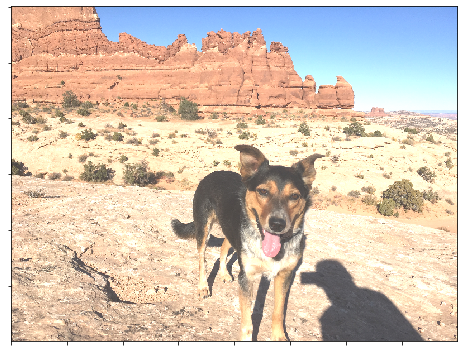

In [65]:
transform = A.RandomBrightness(limit=0.3, p=1)  # see also A.RandomContrast

new_image = transform(image=image)['image']
show_img(new_image)

- Brightness: overall lightness/darkness of image (pixel values)
- Contrast: difference between lightest and darkest parts of image

- Hue: color, think colorwheel with random angle changes
- Saturation: brilliance of the color
- Value: the lightness/darkness of the color (think mixing with white, black paint)

# Colorspace Transformations

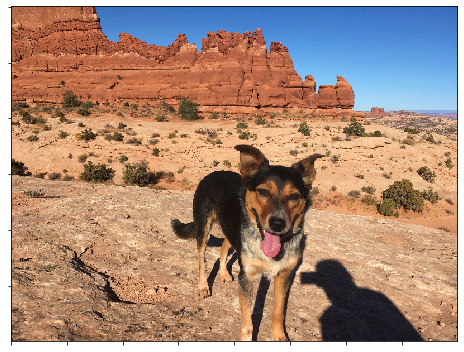

In [70]:
transform = A.HueSaturationValue(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Colorspace Transformations

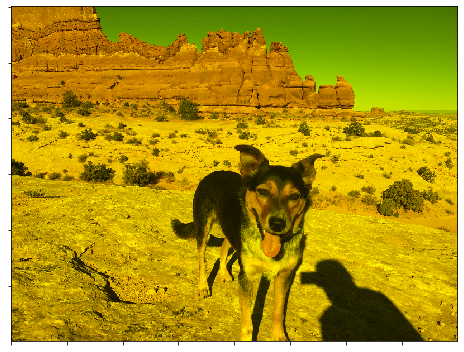

In [76]:
transform = A.ChannelDropout(p=1)  # zero out one of the 3 channels

new_image = transform(image=image)['image']
show_img(new_image)

In [16]:
new_image  # image shape: (600, 800, 3)

array([[[  0, 119,  86],
        [  0, 113,  83],
        [  0, 114,  85],
        ...,
        [  0, 113, 186],
        [  0, 108, 187],
        [  0, 110, 189]],

       [[  0, 115,  85],
        [  0, 116,  86],
        [  0, 113,  83],
        ...,
        [  0, 112, 187],
        [  0, 111, 190],
        [  0, 112, 191]],

       [[  0, 118,  89],
        [  0, 113,  82],
        [  0, 110,  80],
        ...,
        [  0, 114, 187],
        [  0, 113, 192],
        [  0, 112, 191]],

       ...,

       [[  0,  99,  80],
        [  0,  90,  77],
        [  0,  43,  29],
        ...,
        [  0, 142, 109],
        [  0, 154, 120],
        [  0, 146, 113]],

       [[  0, 113,  91],
        [  0, 148, 131],
        [  0, 119,  95],
        ...,
        [  0, 117,  93],
        [  0, 124,  98],
        [  0, 136, 107]],

       [[  0, 103,  86],
        [  0,  93,  75],
        [  0,  59,  47],
        ...,
        [  0, 127, 101],
        [  0, 127, 103],
        [  0, 119,  95]]

# Colorspace Transformations

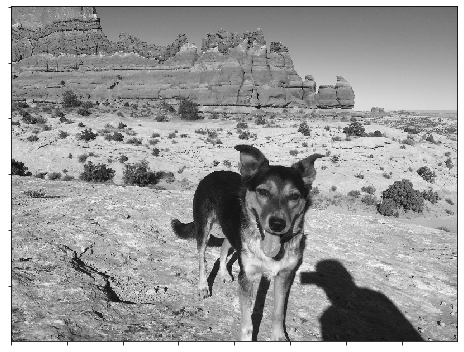

In [17]:
transform = A.ToGray(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Colorspace Transformations

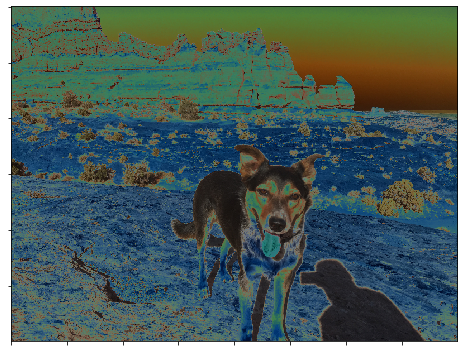

In [18]:
transform = A.Solarize(p=1)  # invert all pixel values above a threshold

new_image = transform(image=image)['image']
show_img(new_image)

# Colorspace Transformation Summary

- Brightness, Contrast are probably the most common
- ChannelDropout removes entire channel(s)
- Other techniques rely on altering histograms of per-channel pixel values
- Lots more options & room for creativity

# Image Transformations

- geometric
- colorspace
- kernel filters $\leftarrow$
- random erasing
- mixing images

# Kernel Filters

Blur or Sharpen images by applying a filter.

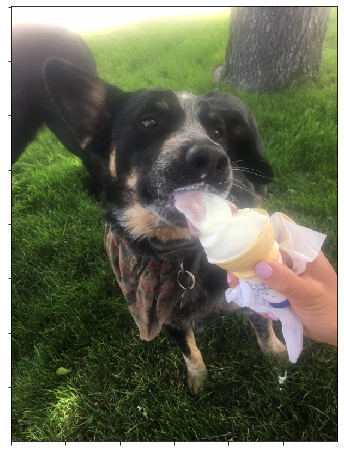

In [77]:
image = cv2.imread('images/gaucho_with_icecream.jpg')  # cute dog #3
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (600, 800))
show_img(image)

# Kernel Filters

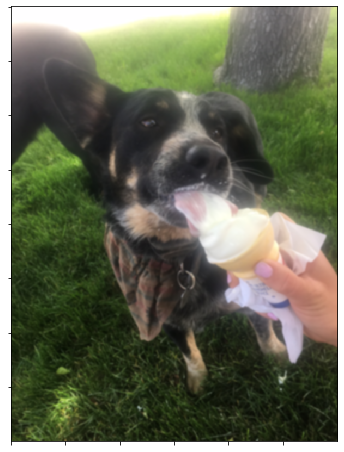

In [20]:
transform = A.GaussianBlur(p=1)  # see also A.MotionBlur

new_image = transform(image=image)['image']

show_img(new_image)

# Kernel Filters

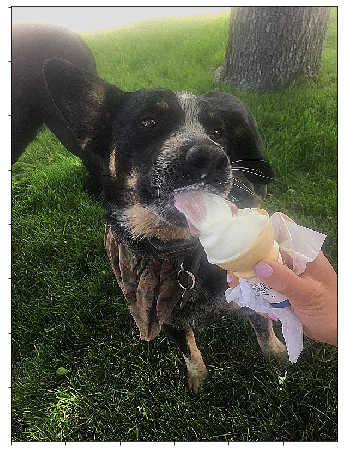

In [21]:
transform = A.imgaug.transforms.IAASharpen(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Kernel Filters Summary

- Blur or Sharpen images
- Similar to the inner working of a CNN: under the hood we are convolving the image with a NxN filter
- Gaussian blur filter (for standard blurring) or an edge filter (for sharpening)
- Good for making your model robust to action shots, especially if all your training images are of similar sharp quality

# Image Transformations

- geometric
- colorspace
- kernel filters
- random erasing $\leftarrow$
- mixing images

# Random Erasing

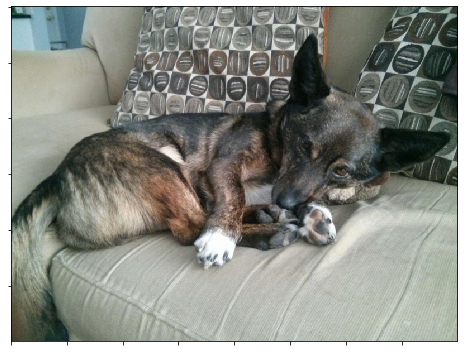

In [78]:
image = cv2.imread('images/couch_dog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (800, 600))
show_img(image)

# Random Erasing

Fill value defaults to 0, but can be customized.

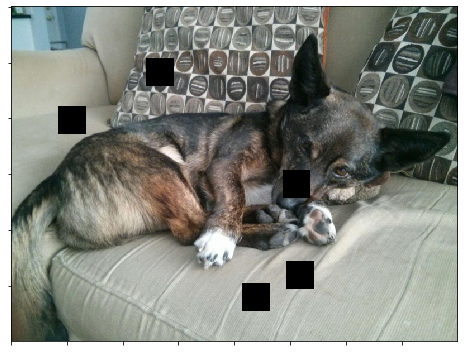

In [80]:
transform = A.Cutout(num_holes=5, max_h_size=50, max_w_size=50, p=1)

new_image = transform(image=image)['image']
show_img(new_image)

# Random Erasing

Fill value defaults to 0, but can be customized. Some results suggest random values are the best fill choice.

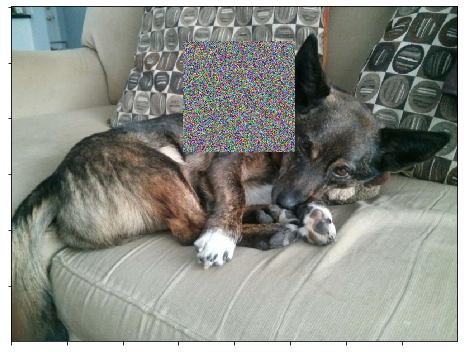

In [24]:
random_fill_values = np.random.randn(200, 200, 3) * image.std() + image.mean()
transform = A.Cutout(num_holes=1, max_h_size=200, max_w_size=200, p=1,
                     fill_value=random_fill_values)

new_image = transform(image=image)['image']
show_img(new_image)

# Random Erasing (aka Cutout) Summary

- Forces model to pay attention to the whole image, not a subset
- Helps overcome issues with occlusion or unclear parts of test images
- Inspired by Dropout\* but acts on the input data

$\rightarrow$ Careful: *this augmentation might not preserve the label!*

\* Dropout: regularization technique that zeros out a random fraction of weights in a neural network layer.

# Image Transformations

- geometric
- colorspace
- kernel filters
- random erasing
- mixing images $\leftarrow$

# Mixing Images

- Unlike previous augmentations, these operate on multiple images
- Beyond scope of `albumentations` library...
- 2 examples:
  - Mixup: averages pixels
  - CutMix: combines crops

$\rightarrow$ _what will the label be when we combine images from different classes?_

# Mixing Images

In [81]:
dog = cv2.imread('images/corgi.jpg')
dog = cv2.cvtColor(dog, cv2.COLOR_BGR2RGB)
dog = cv2.resize(dog, (500, 650))

cat = cv2.imread('images/fluffycat.jpg')
cat = cv2.cvtColor(cat, cv2.COLOR_BGR2RGB)
cat = cv2.resize(cat, (500, 650))

# Mixing Images

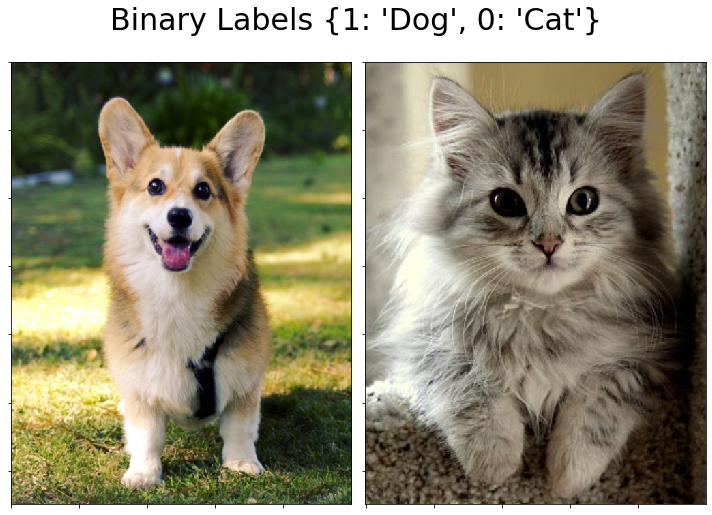

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(10, 8))
for ax, img in zip(axes, [dog, cat]):
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.imshow(img)
plt.tight_layout()
plt.suptitle("Binary Labels {1: 'Dog', 0: 'Cat'}", size=30);

# Mixing Images

In [27]:
# modified from https://github.com/moskomule/mixup.pytorch/blob/master/main.py
def mixup(images, labels, fraction=None):
    image1, image2 = images
    label1, label2 = labels

    if fraction is None:
        fraction = np.random.rand()
    mixed_image = image1 * fraction + (1 - fraction) * image2
    mixed_label = label1 * fraction + (1 - fraction) * label2
    return mixed_image.astype(int), mixed_label


# modified from https://github.com/hysts/pytorch_cutmix/blob/master/cutmix.py
def cutmix(images, labels, alpha=2):
    image1, image2 = images

    image_h, image_w = image1.shape[:2]
    cx = np.random.uniform(0, image_w)
    cy = np.random.uniform(0, image_h)
    lam = np.random.beta(alpha, alpha)
    w = image_w * np.sqrt(1 - lam)
    h = image_h * np.sqrt(1 - lam)
    x0 = int(np.round(max(cx - w / 2, 0)))
    x1 = int(np.round(min(cx + w / 2, image_w)))
    y0 = int(np.round(max(cy - h / 2, 0)))
    y1 = int(np.round(min(cy + h / 2, image_h)))

    mixed_image = image1.copy()
    mixed_image[y0:y1, x0:x1, :] = image2[y0:y1, x0:x1, :]

    fraction = (y1 - y0) * (x1 - x0) / (image_h * image_w)
    mixed_label = fraction * labels[1] + (1 - fraction) * labels[0]

    return mixed_image, mixed_label

Disclaimer: above functions are just toy examples for the simplest illustration of the concepts - they take exactly two images and assume binary classification with label 1 or 0. See the links given for each for more useful code for training that operates on a variable size batch with one-hot labels.

# Mixing Images

Mixup examples:

label: 0.30


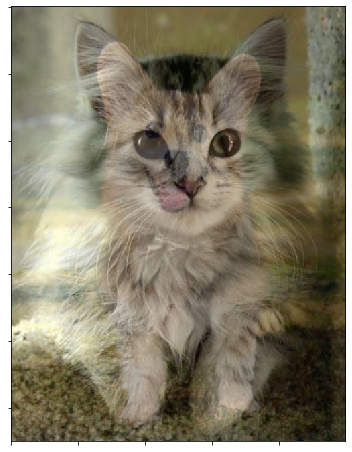

In [85]:
mix_img, mix_label = mixup([dog, cat], [1, 0])
show_img(mix_img)
print('label: {:.2f}'.format(mix_label))

# Mixing Images

CutMix examples:

label: 0.74


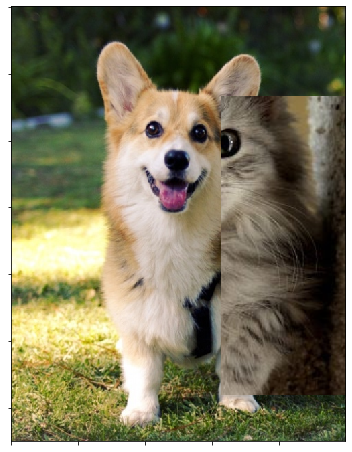

In [90]:
mix_img, mix_label = cutmix([dog, cat], [1, 0])
show_img(mix_img)
print('label: {:.2f}'.format(mix_label))

# Mixing Images Summary

- Mixup (pixel averaging) and CutMix (overlaying crops) are two ways of mixing images
- Possible final label represents fraction of each image in the composite
- Not obvious to humans that this would be useful... but it is!

<img src="https://forums.fast.ai/uploads/default/original/3X/4/b/4b00023c65aa58fbe58b02271de08949e53c64b9.png" style="width: 500px;">

[arXiv:1905.04899](https://arxiv.org/abs/1905.04899)

## A few more random built-in augmentations...

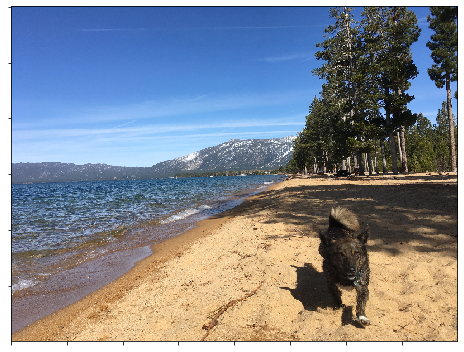

In [30]:
image = cv2.imread('images/toki_in_tahoe.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (800, 600))

show_img(image)

## A few more random built-in augmentations...

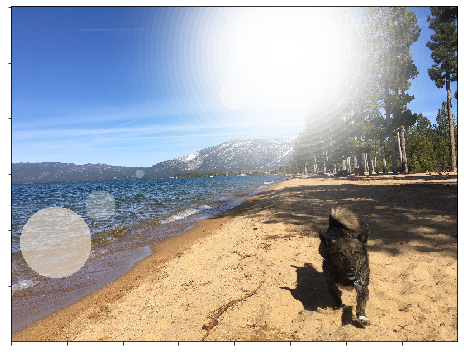

In [31]:
transform = A.RandomSunFlare(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

## A few more random built-in augmentations...

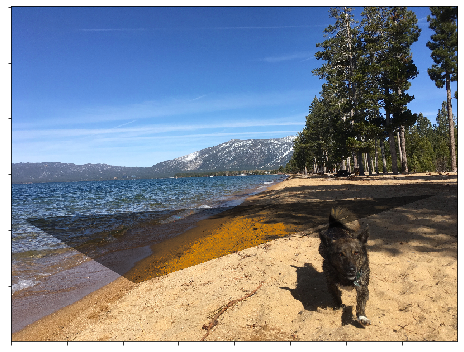

In [32]:
transform = A.RandomShadow(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

## A few more random built-in augmentations...

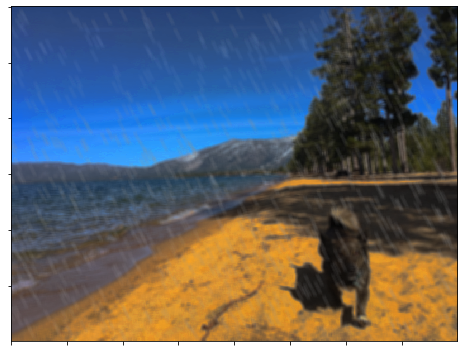

In [33]:
transform = A.RandomRain(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

## A few more random built-in augmentations...

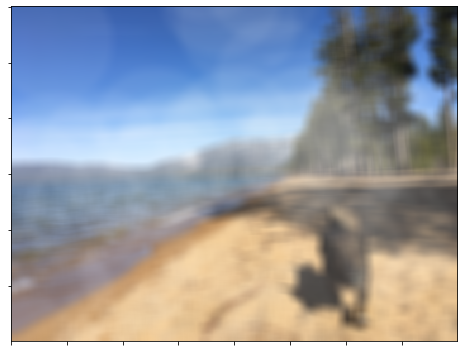

In [34]:
transform = A.RandomFog(p=1)

new_image = transform(image=image)['image']
show_img(new_image)

Pascal VOC Det = transfer learning with fine tuning task

Why does mixing work?
- Cutout helps make models robust to occlusion, but it loses information
- Mixup retains all information but does not solve occlusion
- CutMix gets the best of both
- Maybe also like label smoothing

# Combining Augmentations

In [35]:
transform = A.Compose([

    # geometric
    A.RandomCrop(400, 400, p=1),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5),
    
    # colorspace
    A.RandomBrightness(p=0.5),
    A.HueSaturationValue(p=0.5),

    # kernel
    A.GaussianBlur(p=0.5),
    
    # random erasing
    A.Cutout(num_holes=1, max_h_size=100, max_w_size=100, p=0.5),
    
])

# Combining Augmentations

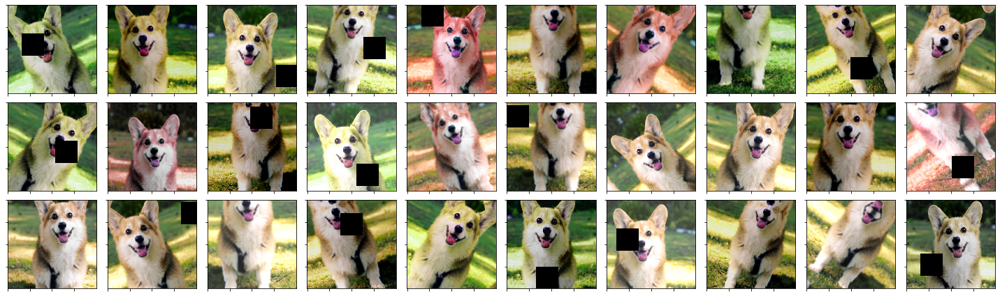

In [36]:
fig, axes = plt.subplots(3, 10, figsize=(20, 6))

for ax in axes.ravel():
    new_image = transform(image=dog)['image']
    ax.imshow(new_image)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
plt.tight_layout()

# Recursion Cellular Image Classification Challenge (RxRx1)

- NeurIPS 2019 Competition hosted on [Kaggle](https://www.kaggle.com/c/recursion-cellular-image-classification)
- Classification problem with 1,108 disease classes (siRNA) across 4 cell types
- Dataset = "RxRx1", Recursion's first big public release of data (learn more or download at [www.rxrx.ai](https://www.rxrx.ai/rxrx1))

<table><tr>
    <td><img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcS2z7UMIH0Otbd5LtIpP3Elsc6iMPzveA3FrbFfEe5wn3G7KT8j&usqp=CAU" style="width: 200px;"></td>
    <td><img src="https://assets.website-files.com/5cb63fe47eb5472014c3dae6/5d03fe719710ab238b5b41b3_384%20Well%402x.png" style="width: 300px;"></td>
    <td><img src="https://assets.website-files.com/5cb63fe47eb5472014c3dae6/5d041d8fc9e4d68543ccb26a_figure4.png" style="width: 800px;"></td>
</tr></table>

<img src="images/kaggle.png" style="width:1200px;">

# Takeaways from Kaggle Competition

- Variety of architectures, lots of ensembles
- Mostly implemented in PyTorch
- Some competition hacks that we don't care to implement (e.g. pseudolabeling)
- Interesting angle-based loss functions (ArcFace, CosFace)
- Test-time Augmentation common

Note: ArcFace is like CrossEntropy with an angular margin for the correct class, so embeddings for the same class are squeezed together, and are more distinct from other classes.

# Takeaways from Kaggle Competition

HEAVY Augmentations used by nearly every team, including:
- Flips & Rotations
- Random Crops
- ShiftScaleRotate
- Noise added
- Brightness & Contrast
- Channel Dropout
- Mixup
- CutMix
- Cutout
- Zoom Transform

# Summary

- PROBLEM: limited training data
- SOLUTION: create more training data (with an eye to the types of transformations we want the model to be robust to)
- `albumentations` is an easy-to-use fast augmentation library
- More recent augmentation techniques mix together different images
- Suprising that some of this works to improve models!
- Active area of research

This presentation is a jupyter notebook! Check it out here: https://github.com/jesford/image-augmentation-demo

interested in working with me? [recursionpharma.com/jobs](https://recursionpharma.com/jobs)